# Project 4 - West Nile Virus Classification

## Part 4 - Prediction Insights & Cost Benefit Analysis

In [1]:
# Import libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import math
import joblib

from sklearn.neighbors import KernelDensity

pd.set_option('display.max_rows', 200)

In [2]:
final_df = pd.read_csv('../assets/clean_data/final_test.csv')

# Model Insights

### Analysis

Using the predictions from the model, we can identify areas in Chicago where wnv is present in the test dataset. Based on year to year analysis, traps that locate wnv present are almost identical with 1 or 2 new areas. We further look into the potential hotspots where wnv present have the highest number of presence:

- West Ohare Airpot
- West Higgins Avenue
- West Foster Avenue
- North Pittsburgh Avenue
- West Armitage Avenue

From the locations, we can identify that the areas are within the north cluster of Chicago. An area gauge that can be considered when prioritizing and managing the handling of wnv moving forward.

In [3]:
# Changing format data and sperate by year, month, day and week
final_df['date'] = pd.to_datetime(final_df['date'])
final_df['year'] = final_df['date'].apply(lambda x: x.year)
final_df['month'] = final_df['date'].apply(lambda x: x.month)
final_df['week'] = final_df['date'].apply(lambda x: x.week)
final_df['dayofweek'] = final_df['date'].apply(lambda x: x.dayofweek)

In [4]:
# Filter dataset to only WNV present == 1
wnv_final = final_df[final_df['wnvpresent'] == 1]

In [5]:
# WNV present
final_df[final_df['wnvpresent'] == 1]['wnvpresent'].sum()

16037

In [6]:
# WNV present on test dataset
final_df['year'].value_counts().sort_index()

2008    30498
2010    36557
2012    27115
2014    22123
Name: year, dtype: int64

In [7]:
# WNV present yearly
wnv_final['year'].value_counts().sort_index()

2008    3374
2010    4008
2012    4682
2014    3973
Name: year, dtype: int64

In [8]:
# Top 10 hotspot location yearly
for i in wnv_final['year'].unique():
    year_loc = wnv_final[wnv_final['year'] == i]['addressnumberandstreet'].value_counts().head(10)
    
    print (f'Year: {i}')
    print (year_loc)
    print('')

Year: 2008
1000  W OHARE AIRPORT, Chicago, IL       115
9100  W HIGGINS AVE, Chicago, IL          95
7900  W FOSTER AVE, Chicago, IL           95
3600  N PITTSBURGH AVE, Chicago, IL       76
4600  N MELVINA AVE, Chicago, IL          75
7000   W ARMITAGE AVENUE, Chicago, IL     75
4900  W BALMORAL AVE, Chicago, IL         75
6800  W BELDEN AVE, Chicago, IL           74
4500  N CAMPBELL AVE, Chicago, IL         72
3300  N RUTHERFORD AVE, Chicago, IL       68
Name: addressnumberandstreet, dtype: int64

Year: 2010
1000  W OHARE AIRPORT, Chicago, IL       99
7900  W FOSTER AVE, Chicago, IL          76
9100  W HIGGINS AVE, Chicago, IL         76
4900  W BALMORAL AVE, Chicago, IL        63
4600  N MELVINA AVE, Chicago, IL         63
3600  N PITTSBURGH AVE, Chicago, IL      62
1400  W 112TH ST, Chicago, IL            59
7000   W ARMITAGE AVENUE, Chicago, IL    56
6800  W BELDEN AVE, Chicago, IL          56
3700  N KILBOURN AVE, Chicago, IL        54
Name: addressnumberandstreet, dtype: int64



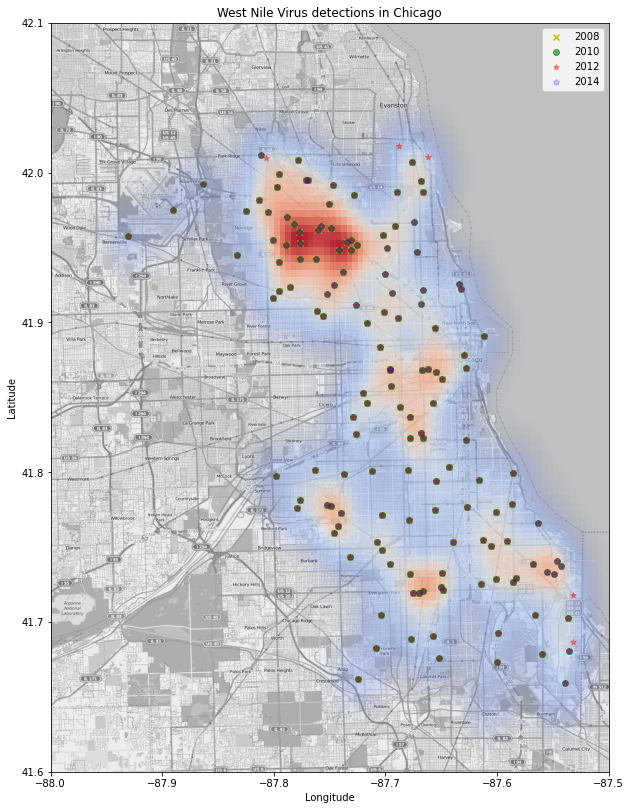

In [9]:
# Traps are located
alpha_cm = plt.cm.coolwarm
alpha_cm._init()
alpha_cm._lut[:-3,-1] = abs(np.logspace(0, 1, alpha_cm.N) / 10 - 1)[::-1]
mapdata = np.loadtxt("../assets/raw_data/mapdata_copyright_openstreetmap_contributors.txt")
aspect = mapdata.shape[0] * 1.0 / mapdata.shape[1]

lon_lat_box = (-88, -87.5, 41.6, 42.1)

#spray locations
X = final_df[['longitude', 'latitude']].drop_duplicates().values
kd = KernelDensity(bandwidth=0.015)
kd.fit(X)

xv,yv = np.meshgrid(np.linspace(-88, -87.5, 100), np.linspace(41.6, 42.1, 100))
gridpoints = np.array([xv.ravel(),yv.ravel()]).T
zv = np.exp(kd.score_samples(gridpoints).reshape(100,100))

#kernel density
plt.figure(figsize=(10,14))
plt.imshow(mapdata, cmap=plt.get_cmap('gray'), extent=lon_lat_box, aspect=aspect)
plt.imshow(zv, origin='lower', cmap=alpha_cm, extent=lon_lat_box, aspect=aspect)

# wnv outbreak locations
trap_locations1 = wnv_final[(wnv_final['wnvpresent'] == 1) & (wnv_final['year'] == 2008)][['longitude', 'latitude']].drop_duplicates().values
plt.scatter(trap_locations1[:,0], trap_locations1[:,1], marker='x', c='y', label='2008')

trap_locations2 = wnv_final[(wnv_final['wnvpresent'] == 1) & (wnv_final['year'] == 2010)][['longitude', 'latitude']].drop_duplicates().values
plt.scatter(trap_locations2[:,0], trap_locations2[:,1], marker='o', c='g', alpha=.6, label='2010')

trap_locations3 = wnv_final[(wnv_final['wnvpresent'] == 1) & (wnv_final['year'] == 2012)][['longitude', 'latitude']].drop_duplicates().values
plt.scatter(trap_locations3[:,0], trap_locations3[:,1], marker='*', c='r', alpha=.4, label='2012')

trap_locations2 = wnv_final[(wnv_final['wnvpresent'] == 1) & (wnv_final['year'] == 2010)][['longitude', 'latitude']].drop_duplicates().values
plt.scatter(trap_locations2[:,0], trap_locations2[:,1], marker='p', c='b', alpha=.2, label='2014')


plt.title('West Nile Virus detections in Chicago')
plt.legend()
plt.xlabel('Longitude')
plt.ylabel('Latitude');

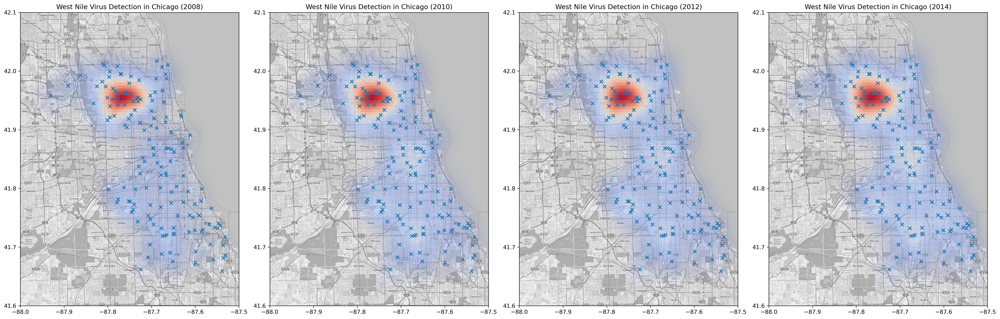

In [10]:
# Wnv present on yearly basis (comparison)
mapdata = np.loadtxt("../assets/raw_data/mapdata_copyright_openstreetmap_contributors.txt")

alpha_cm = plt.cm.coolwarm
alpha_cm._init()
alpha_cm._lut[:-3,-1] = abs(np.logspace(0, 1, alpha_cm.N) / 10 - 1)[::-1]
aspect = mapdata.shape[0] * 1.0 / mapdata.shape[1]
lon_lat_box = (-88, -87.5, 41.6, 42.1)

plt.figure(figsize=(25,10), dpi=300)
for year, subplot in zip([2008, 2010, 2012, 2014], [141, 142, 143, 144]):
    sightings = wnv_final[(wnv_final['wnvpresent'] > 0) & (wnv_final['date'].apply(lambda x: x.year) == year)]
    sightings = sightings.groupby(['date', 'trap' ,'longitude', 'latitude']).max()['wnvpresent'].reset_index()
    
    X = sightings[['longitude', 'latitude']].values
    kd = KernelDensity(bandwidth=0.02)
    kd.fit(X)

    xv,yv = np.meshgrid(np.linspace(-88, -87.5, 100), np.linspace(41.6, 42.1, 100))
    gridpoints = np.array([xv.ravel(),yv.ravel()]).T
    zv = np.exp(kd.score_samples(gridpoints).reshape(100,100))
    
    plt.subplot(subplot)
    plt.gca().set_title(f'West Nile Virus Detection in Chicago ({year})')
    plt.imshow(mapdata, 
               cmap=plt.get_cmap('gray'), 
               extent=lon_lat_box, 
               aspect=aspect)
    plt.imshow(zv, 
               origin='lower', 
               cmap=alpha_cm, 
               extent=lon_lat_box, 
               aspect=aspect)
    plt.tight_layout()
    locations = wnv_final[['longitude', 'latitude']].drop_duplicates().values
    plt.scatter(locations[:,0], locations[:,1], marker='x')

---
# Cost Benefit Analysis

**Overview**

In this [study](https://www.sciencedaily.com/releases/2014/02/140210184713.htm), we understand that:
- for a period of 14 years since the virus was first detected in New York, the WNV disease has cost a cumulative \\$778 million in health care expenditures and lost productivity (i.e. cost of approx. \\$56 million per year)
- Although there is a likelihood of underestimation, over 37,000 WNV cases have been report in these 14 years (i.e. on average more than 2,600 cases per year) 
- On average, without taking into account inflation, cost (both medical and lost in productivity) per WNV case amount to approximately \\$21,000
    
If budget permits, it will be ideal to deploy mosquito control measures in the whole of Chicago daily throughout the year. However, we are aware that this method is not ideal in view of the cost involved. Even if budget is available, there will be a huge opportunity cost for not being able to set aside public funds for other use.  

**Cost**

On average, without taking into factors such as bulk discount, mosquito spray will cost \\$500 for every half acre per each time [(source)](https://www.fixr.com/costs/mosquito-control) or \\$182,500 for every half acre daily for the entire year. 

Having said that, it is not necessary to incur such expenses because of the opportunity cost involved. Besides, even though WNV can cause disease in humans, to-date, there is no evidence of WNV transmission from person to person [(source)](https://www.medicinenet.com/west_nile_encephalitis/article.htm).

Hence, predictive modelling can be useful to guide decision makers when it comes to deploying mosquito control measures.

**Benefit**

By utilising the model developed, we predicted the following occurences:


|Year       | Total locations  | Number of WNV cases predicted|Percentage of cases|
|---------------|--------------|---|--|
| 2008 |  30,498  | 3,806|13%|
| 2010 |  36,557  | 4,408|12%|
| 2012 |  27,115  | 4,866|18%|
| 2014 |  22,123  | 4,050|18%|

Overall, based on simple average, among all locations, WNV is likely to be present in 15\% of the locations per year. So instead of costing \\$182,500 for every half acre per year, it will only cost us 15\% of that amount, i.e. $27,375. The remaining 85\% of the budget can be freed up for other critical use.

---
# Conclusion & Recommendations

### Conclusion

The best model successfully classifies the presence of WNV in our problem statement (predictions on the possibility of West Nile Virus occurrence on various locations in Chicago). Unfortunately, this model does not achieve the total eradication of mosquitoes. Most features of importance in the model are beyond our control (such as weather) and the datasets that we have are very imbalanced, so inference would not directly help reduce the cases of WNV present drastically.

However, this does not mean that the model is not helpful at all. We can identify common hotspots areas throughout the years can further monitor and target these areas by implementing further treatments.

While spraying is proven to be more effective cost of treatment compared to patients treament, it may also cause affects to the public health, hence a moderate, well planned strategy will help curb these issues by looking into targeted areas.

#### Best Model
- AdaBoostClassifier() with learning_rate: 0.5 & n_estimators: 200
- Recall score: 0.6423
- ROC_AUC score: 0.8082

### Recommendations

While the model performs relatively well, they are many flaws and ways to further improve it's accuracy. Following are some recommendations that we can implement:

##### 1) More control measures
While surveillance and control systems are in place, our stakeholders can do regular checks on mosquito breeding areas weekly or fortnightly may help ensure tight monitoring of mosquito activities. 

Putting more effort to focus on hotspot areas and their surroundings will be beneficial to control the spread and increasing populations while identifying possible environmental factors that further boost reasons of high breeding in the area.

Ultimately destroying the mosquito and its breeding areas will reduce the number of West Nile virus. 

##### 2) Research & Development Investment
While spraying pesticides is a common way to rid mosquitoes, newer technologies and methods may further increase the efficiency. 

For example, deploying Aedes Aegypti experiment where genetically modified male mosquitoes are bred and release into the wild to pass on to its female counterpart gene that will require them an antibiotic to survive, else died in the wild. 

##### 3) Community Participation
Community involvement can also increase efficiency in supressing mosquito breeding. 

By educating the community on the dangers and effects of West Nile virus and how they can help stakeholders, e.g. making a report

---